In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append("../src")
import model.sdes as sdes
import model.generate as generate
import model.cifar_unet as cifar_unet
import model.util as model_util
from plot.plot import plot_mnist_digits
from analysis.fid import compute_fid
import torch
import torchvision
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt
import os

In [2]:
# Define device
if torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"

In [3]:
classes = list(range(100))

dataset = torchvision.datasets.CIFAR100(
    "/gstore/scratch/u/tsenga5/datasets/CIFAR-100", train=True, transform=(lambda img: (np.transpose(np.asarray(img), (2, 0, 1)) / 256 * 2) - 1)
)

# Limit classes
dataset.targets = np.array(dataset.targets)
inds = np.isin(dataset.targets, classes)
dataset.data = dataset.data[inds]
dataset.targets = dataset.targets[inds]

data_loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True, num_workers=2)
sample_x, sample_y = next(iter(data_loader))
input_shape = sample_x.shape[1:]

In [4]:
def class_to_class_index_tensor(c):
    """
    Given a tensor of classes, return the corresponding class indices
    as a tensor.
    """
    return torch.argmax(
        (c[:, None] == torch.tensor(classes, device=c.device)).int(), dim=1
    ).to(DEVICE)

In [5]:
# Create the SDE and model
sde = sdes.VariancePreservingSDE(0.1, 20, input_shape)

t_limit = 1
model = cifar_unet.LabelGuidedUNet(
    len(classes), t_limit=t_limit
).to(DEVICE)

os.environ["MODEL_DIR"] = "/gstore/scratch/u/tsenga5/branched_diffusion/models/trained_models/cifar_playground"

import model.train_continuous_model as train_continuous_model  # Import this AFTER setting environment

In [6]:
def plot_cifar(
    images, grid_size=(10, 5), scale=1, clip=False, title=None
):
    """
    Plots CIFAR objects. No normalization will be done.
    Arguments:
        `images`: a B x 3 x 28 x 28 NumPy array of numbers between
            0 and 1
        `grid_size`: a pair of integers denoting the number of images
            to plot horizontally and vertically (in that order); if
            more digits are provided than spaces in the grid, leftover
            digits will not be plotted; if fewer images are provided
            than spaces in the grid, there will be at most one
            unfinished row
        `scale`: amount to scale figure size by
        `clip`: if True, clip values to between 0 and 1
        `title`: if given, title for the plot
    """
    images = np.transpose(images, (0, 2, 3, 1))
    if clip:
        images = np.clip(images, 0, 1)

    width, height = grid_size
    num_images = len(images)
    height = min(height, num_images // width)

    figsize = (width * scale, (height * scale) + 0.5)

    fig, ax = plt.subplots(
        ncols=width, nrows=height,
        figsize=figsize, gridspec_kw={"wspace": 0, "hspace": 0}
    )
    if height == 1:
        ax = [ax]
    if width == 1:
        ax = [[a] for a in ax]

    for j in range(height):
        for i in range(width):
            index = i + (width * j)
            ax[j][i].imshow(images[index], cmap="gray", aspect="auto", interpolation=None)
            ax[j][i].axis("off")
    if title:
        ax[0][0].set_title(title)
    plt.subplots_adjust(bottom=0.25)
    return fig

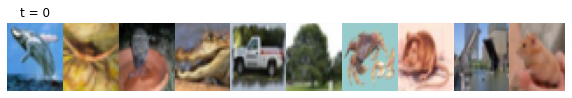

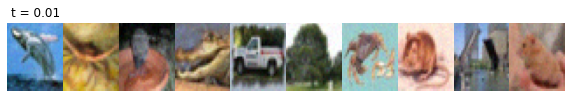

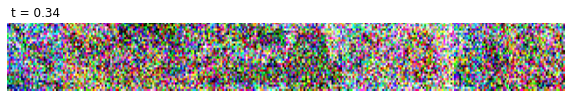

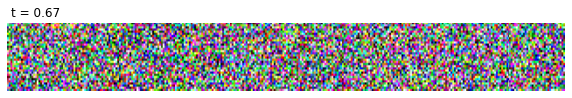

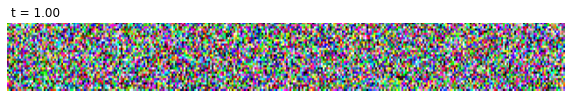

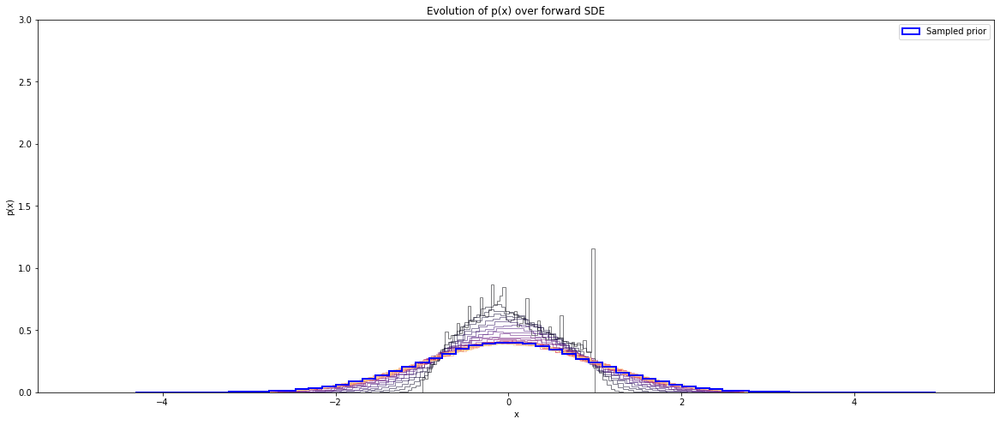

In [7]:
# Show some images after running the SDE forward for different times
time_steps = 4

x0, _ = next(iter(data_loader))
x0 = x0.cpu().numpy()

plot_cifar((x0 + 1) / 2, grid_size=(10, 1), clip=True, title="t = 0")
x0 = torch.tensor(x0).to(DEVICE)
for t in np.linspace(0.01, t_limit, time_steps):
    xt, score = sde.forward(x0, torch.full(x0.shape[:1], t).to(DEVICE))
    plot_cifar((xt.cpu().numpy() + 1) / 2, grid_size=(10, 1), clip=True, title=("t = %.2f" % t))
    
# Show the transformation of the distribution of data to the prior distribution
time_steps = 30

all_t = np.linspace(0, t_limit, time_steps)
all_xt = np.empty((len(all_t),) + x0.shape)
for t_i, t in enumerate(all_t):
    xt, _ = sde.forward(x0, torch.ones(len(x0)).to(DEVICE) * t)
    all_xt[t_i] = xt.cpu().numpy()

fig, ax = plt.subplots(figsize=(20, 8))
cmap = plt.get_cmap("magma")
for t_i in range(len(all_t)):
    ax.hist(np.ravel(all_xt[t_i]), bins=60, histtype="step", color=cmap(t_i / len(all_t)), alpha=0.5, density=True)
prior = sde.sample_prior(len(x0), torch.ones(len(x0)).to(DEVICE) * t).cpu().numpy()
ax.hist(np.ravel(prior), bins=60, histtype="step", color="blue", linewidth=2, density=True, label="Sampled prior")
ax.set_xlabel("x")
ax.set_ylabel("p(x)")
ax.set_title("Evolution of p(x) over forward SDE")
ax.set_ylim((0, 3))
plt.legend()
plt.show()

In [8]:
# train_continuous_model.train_ex.run(
#     "train_label_guided_model",
#     config_updates={
#         "model": model,
#         "sde": sde,
#         "data_loader": data_loader,
#         "class_to_class_index": class_to_class_index_tensor,
#         "num_epochs": 300,
#         "learning_rate": 0.001,
#         "t_limit": t_limit,
#         "loss_weighting_type": "empirical_norm"
#     }
# )

In [10]:
model = model_util.load_model(
    cifar_unet.LabelGuidedUNet,
    os.path.join(
        "/gstore/scratch/u/tsenga5/branched_diffusion/models/trained_models/",
        "cifar_continuous_labelguided_100classes_small/2/epoch_20_ckpt.pth"
    )
).to(DEVICE)

Sampling class: apple


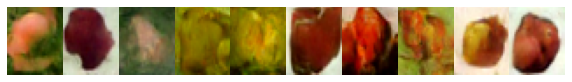

Sampling class: aquarium_fish


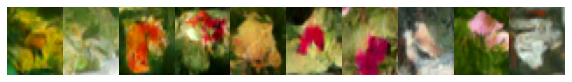

Sampling class: baby


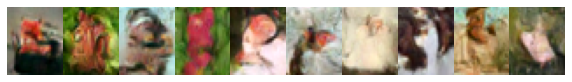

Sampling class: bear


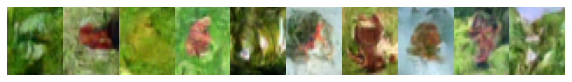

Sampling class: beaver


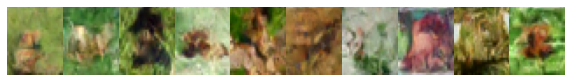

Sampling class: bed


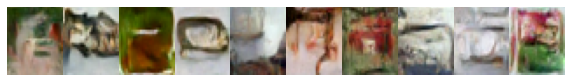

Sampling class: bee


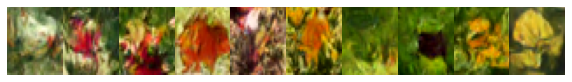

Sampling class: beetle


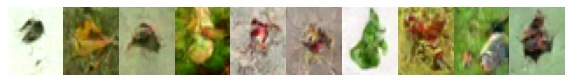

Sampling class: bicycle


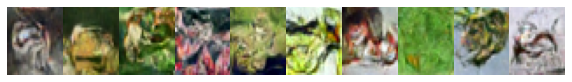

Sampling class: bottle


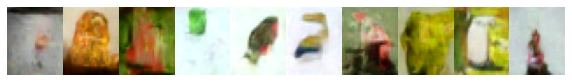

Sampling class: bowl


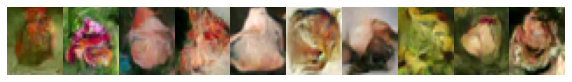

Sampling class: boy


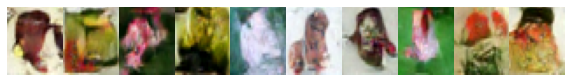

Sampling class: bridge


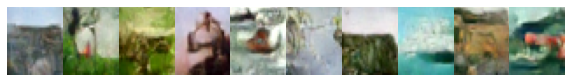

Sampling class: bus


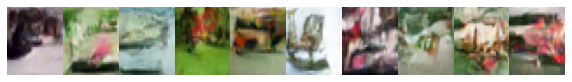

Sampling class: butterfly


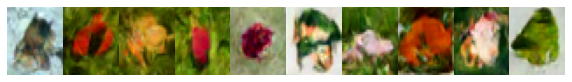

Sampling class: camel


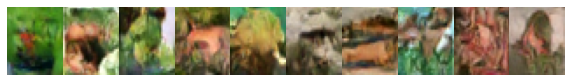

Sampling class: can


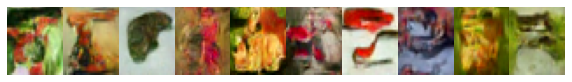

Sampling class: castle


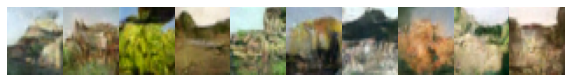

Sampling class: caterpillar


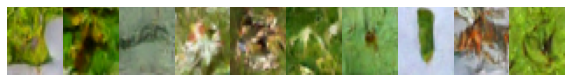

Sampling class: cattle


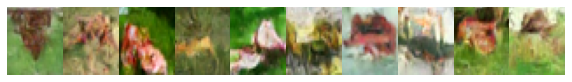

Sampling class: chair


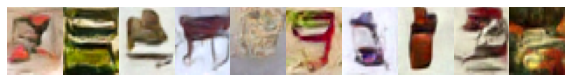

Sampling class: chimpanzee


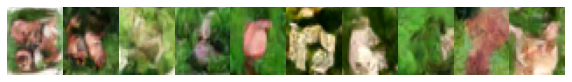

Sampling class: clock


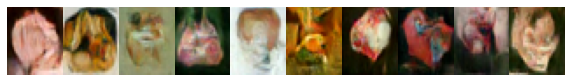

Sampling class: cloud


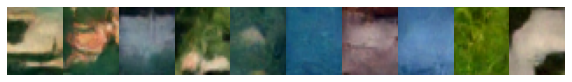

Sampling class: cockroach


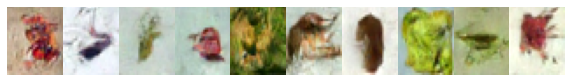

Sampling class: couch


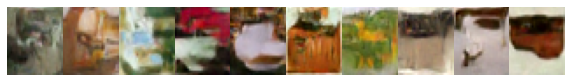

Sampling class: crab


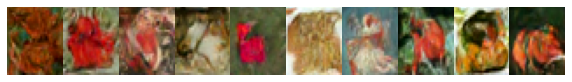

Sampling class: crocodile


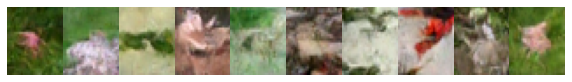

Sampling class: cup


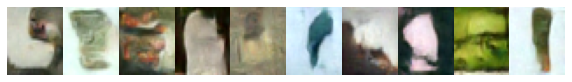

Sampling class: dinosaur


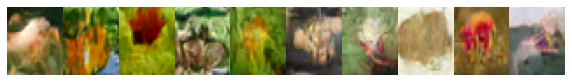

Sampling class: dolphin


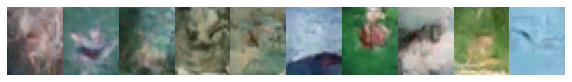

Sampling class: elephant


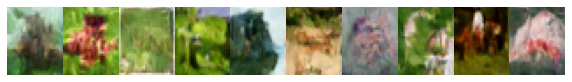

Sampling class: flatfish


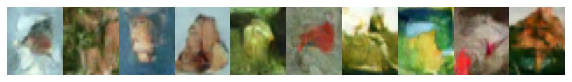

Sampling class: forest


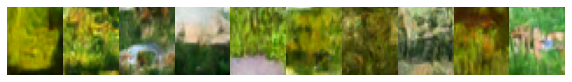

Sampling class: fox


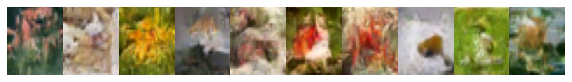

Sampling class: girl


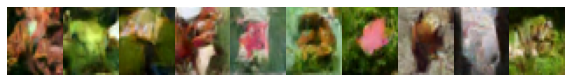

Sampling class: hamster


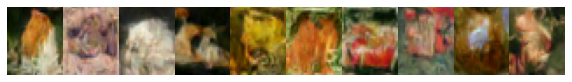

Sampling class: house


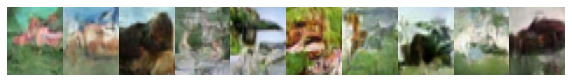

Sampling class: kangaroo


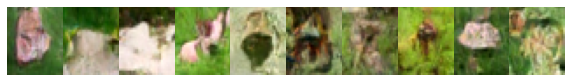

Sampling class: keyboard


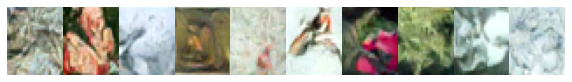

Sampling class: lamp


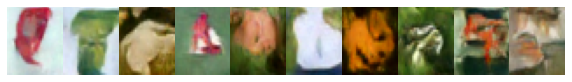

Sampling class: lawn_mower


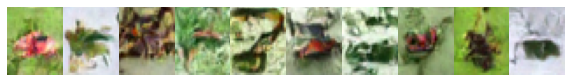

Sampling class: leopard


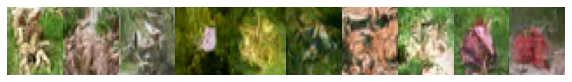

Sampling class: lion


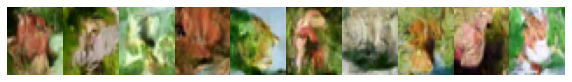

Sampling class: lizard


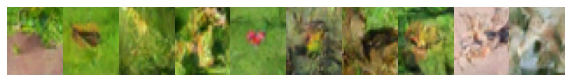

Sampling class: lobster


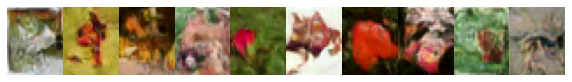

Sampling class: man


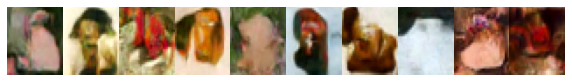

Sampling class: maple_tree


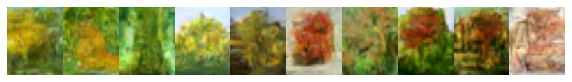

Sampling class: motorcycle


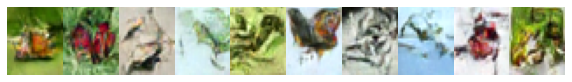

Sampling class: mountain


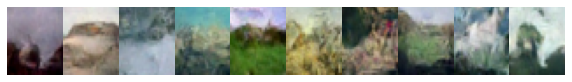

Sampling class: mouse


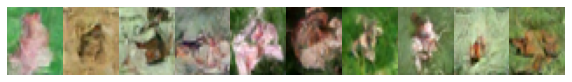

Sampling class: mushroom


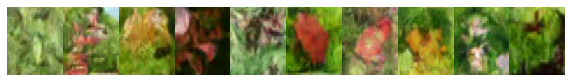

Sampling class: oak_tree


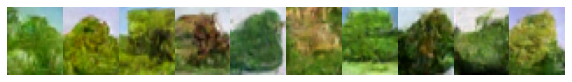

Sampling class: orange


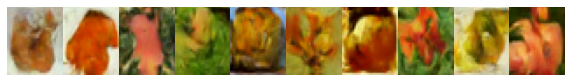

Sampling class: orchid


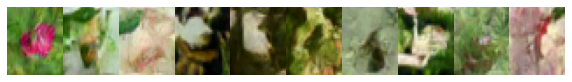

Sampling class: otter


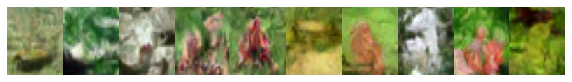

Sampling class: palm_tree


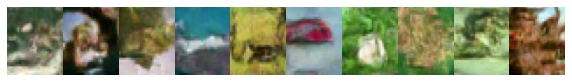

Sampling class: pear


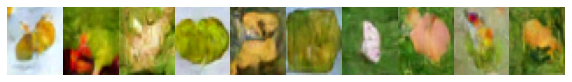

Sampling class: pickup_truck


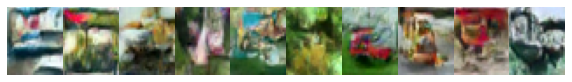

Sampling class: pine_tree


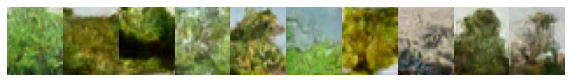

Sampling class: plain


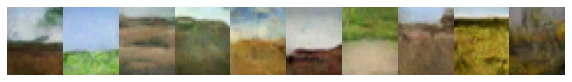

Sampling class: plate


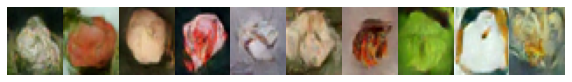

Sampling class: poppy


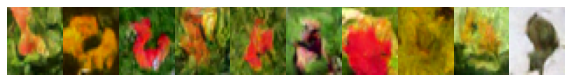

Sampling class: porcupine


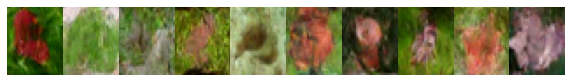

Sampling class: possum


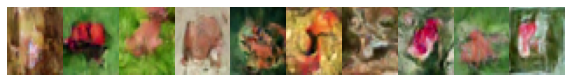

Sampling class: rabbit


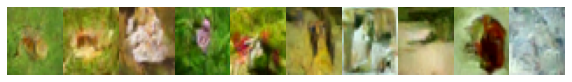

Sampling class: raccoon


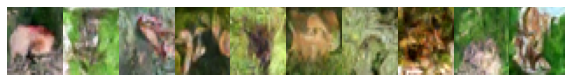

Sampling class: ray


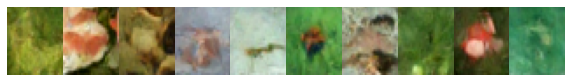

Sampling class: road


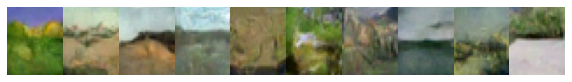

Sampling class: rocket


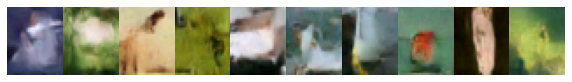

Sampling class: rose


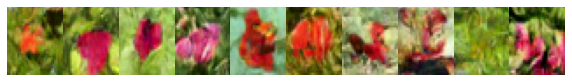

Sampling class: sea


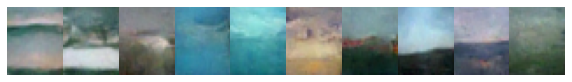

Sampling class: seal


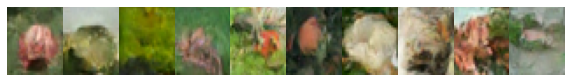

Sampling class: shark


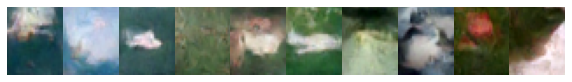

Sampling class: shrew


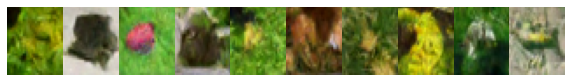

Sampling class: skunk


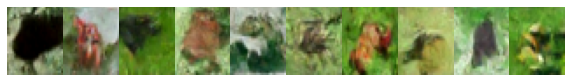

Sampling class: skyscraper


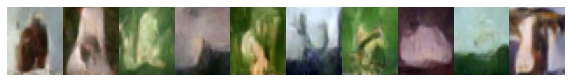

Sampling class: snail


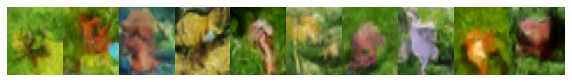

Sampling class: snake


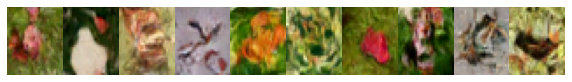

Sampling class: spider


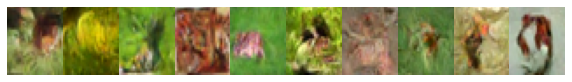

Sampling class: squirrel


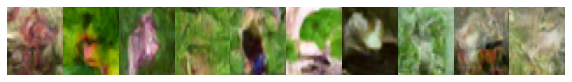

Sampling class: streetcar


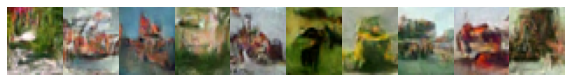

Sampling class: sunflower


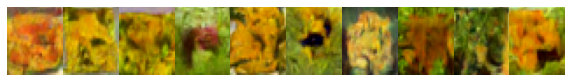

Sampling class: sweet_pepper


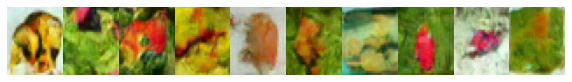

Sampling class: table


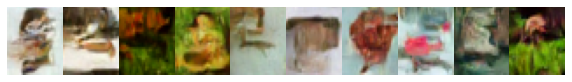

Sampling class: tank


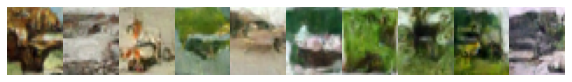

Sampling class: telephone


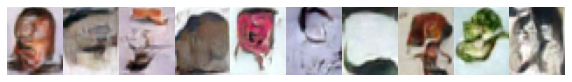

Sampling class: television


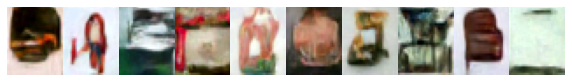

Sampling class: tiger


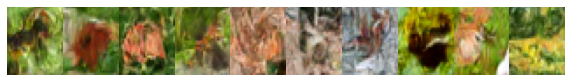

Sampling class: tractor


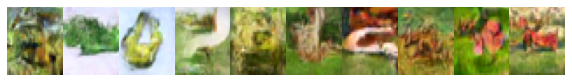

Sampling class: train


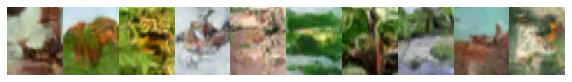

Sampling class: trout


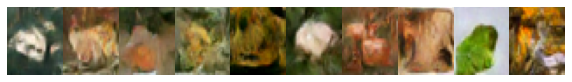

Sampling class: tulip


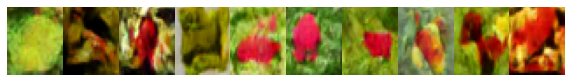

Sampling class: turtle


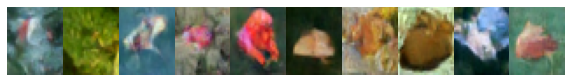

Sampling class: wardrobe


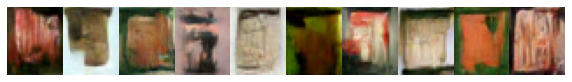

Sampling class: whale


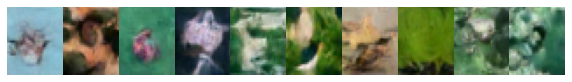

Sampling class: willow_tree


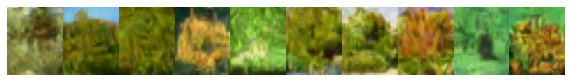

Sampling class: wolf


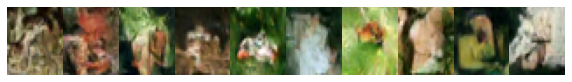

Sampling class: woman


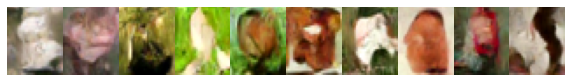

Sampling class: worm


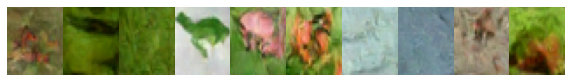

In [11]:
gen_samples = {}
for class_to_sample in classes:
    print("Sampling class: %s" % dataset.classes[class_to_sample])
    samples = generate.generate_continuous_label_guided_samples(
        model, sde, class_to_sample, class_to_class_index_tensor,
        sampler="pc", t_limit=t_limit
    ).cpu().numpy()
    gen_samples[class_to_sample] = samples
    plot_cifar((samples + 1) / 2, grid_size=(10, 1), clip=True, title=None)
    plt.show()

In [12]:
true_samples = {}
for class_to_sample in classes:
    print("Sampling class: %s" % class_to_sample)
    inds = np.where(dataset.targets == class_to_sample)[0]
    sample_inds = np.random.choice(inds, size=200, replace=False)
    samples = np.transpose((dataset.data[sample_inds] / 256 * 2) - 1, (0, 3, 1, 2))
    true_samples[class_to_sample] = samples
    # plot_cifar((samples + 1) / 2, grid_size=(10, 1), title=None)

Sampling class: 0
Sampling class: 1
Sampling class: 2
Sampling class: 3
Sampling class: 4
Sampling class: 5
Sampling class: 6
Sampling class: 7
Sampling class: 8
Sampling class: 9
Sampling class: 10
Sampling class: 11
Sampling class: 12
Sampling class: 13
Sampling class: 14
Sampling class: 15
Sampling class: 16
Sampling class: 17
Sampling class: 18
Sampling class: 19
Sampling class: 20
Sampling class: 21
Sampling class: 22
Sampling class: 23
Sampling class: 24
Sampling class: 25
Sampling class: 26
Sampling class: 27
Sampling class: 28
Sampling class: 29
Sampling class: 30
Sampling class: 31
Sampling class: 32
Sampling class: 33
Sampling class: 34
Sampling class: 35
Sampling class: 36
Sampling class: 37
Sampling class: 38
Sampling class: 39
Sampling class: 40
Sampling class: 41
Sampling class: 42
Sampling class: 43
Sampling class: 44
Sampling class: 45
Sampling class: 46
Sampling class: 47
Sampling class: 48
Sampling class: 49
Sampling class: 50
Sampling class: 51
Sampling class: 52
Sam

In [17]:
# Compute FID scores
fid_scores = {}
for class_to_sample in classes:
    print("FID of %d" % class_to_sample)
    fid = compute_fid(gen_samples[class_to_sample], true_samples[class_to_sample])
    fid_scores[class_to_sample] = fid
    print("FID: %.4f" % fid)

FID of 0
FID: 620.4303
FID of 1
FID: 451.8291
FID of 2
FID: 428.3779
FID of 3
FID: 359.8881
FID of 4
FID: 292.1368
FID of 5
FID: 352.6736
FID of 6
FID: 597.1039
FID of 7
FID: 288.7531
FID of 8
FID: 402.0585
FID of 9
FID: 347.4022
FID of 10
FID: 420.4236
FID of 11
FID: 420.2839
FID of 12
FID: 337.2416
FID of 13
FID: 434.1318
FID of 14
FID: 430.0429
FID of 15
FID: 418.8235
FID of 16
FID: 378.2985
FID of 17
FID: 338.0118
FID of 18
FID: 292.6200
FID of 19
FID: 358.5081
FID of 20
FID: 506.6987
FID of 21
FID: 434.7277
FID of 22
FID: 431.9771
FID of 23
FID: 231.1994
FID of 24
FID: 580.8619
FID of 25
FID: 367.8750
FID of 26
FID: 343.8554
FID of 27
FID: 284.3955
FID of 28
FID: 327.5980
FID of 29
FID: 493.6084
FID of 30
FID: 343.4312
FID of 31
FID: 349.4762
FID of 32
FID: 503.8371
FID of 33
FID: 322.0379
FID of 34
FID: 295.9208
FID of 35
FID: 473.8893
FID of 36
FID: 549.3408
FID of 37
FID: 342.6843
FID of 38
FID: 332.4469
FID of 39
FID: 389.3547
FID of 40
FID: 380.6523
FID of 41
FID: 626.0565
FI

In [18]:
fid_scores

{0: 620.4303091367758,
 1: 451.8291489442545,
 2: 428.3779163863029,
 3: 359.888136527977,
 4: 292.1368111382898,
 5: 352.67359536989,
 6: 597.103873778929,
 7: 288.7531082984465,
 8: 402.0584626491549,
 9: 347.4022018802618,
 10: 420.42359929332514,
 11: 420.28391238489746,
 12: 337.2415682153661,
 13: 434.1318055153308,
 14: 430.0429052704981,
 15: 418.8235291299636,
 16: 378.2985443299791,
 17: 338.0117930256224,
 18: 292.61999351527385,
 19: 358.50809869687913,
 20: 506.698721203982,
 21: 434.7276738355272,
 22: 431.97710797282076,
 23: 231.19936315375656,
 24: 580.861927642286,
 25: 367.874975915251,
 26: 343.85544702449147,
 27: 284.3955307217226,
 28: 327.59796355927324,
 29: 493.60838700913314,
 30: 343.43117246489,
 31: 349.47620851549914,
 32: 503.83711147153235,
 33: 322.03789791637706,
 34: 295.92076736226994,
 35: 473.88930387526796,
 36: 549.3407934200591,
 37: 342.684345321248,
 38: 332.4469353146674,
 39: 389.3546708229118,
 40: 380.6523415285956,
 41: 626.0565348250094